In [1]:
import pyshtools
import numpy as np 
from sh_utils import compute_background
from PIL import Image
import skimage
#01000/01237
from sphere_helper import drawSphere, drawMap
import torch

In [2]:
filenames = [
    "01000/01237",
    "00000/00700",
    "00000/00495",
    "01000/01923",
    "01000/01133",
    "00000/00715",
    "00000/00497",
    "00000/00644",
    "00000/00554",
    "01000/01173"
]
DATASET_DIR = "../../datasets/face/face2000_single/"

In [3]:
def generate_face(filenames):
    output = []
    for fname in filenames:
        source_image = skimage.io.imread(f"{DATASET_DIR}/images/{fname}.png")
        source_image = skimage.transform.resize(source_image, (256, 256))
        if source_image.shape[2] == 4:
            source_image = skimage.color.rgba2rgb(source_image)
        sh_coeff = np.load(f"{DATASET_DIR}/light/{fname}_light.npy")
        sh_coeff[0:2,:] = 0
        sh_coeff[3:,:] = 0
        envmap = drawMap(torch.tensor(sh_coeff), img_size=256)[0].permute(1, 2, 0).numpy()
        sphere_front = drawSphere(torch.tensor(sh_coeff))
        sphere_front = sphere_front.permute(1, 2, 0).numpy()
        sphere_back = drawSphere(torch.tensor(sh_coeff), is_back=True)
        sphere_back = sphere_back.permute(1, 2, 0).numpy()
        image = np.concatenate([source_image, sphere_front, sphere_back, envmap], axis=1)
        output.append(image)
        #image = skimage.img_as_ubyte(image)
        #img = Image.fromarray(image)
        #print(f"{fname}.png")
        #gray_coeff = 0.299 * sh_coeff[:,0] + 0.587 * sh_coeff[:,1] + 0.114 * sh_coeff[:,2]
        #print(f"X: {gray_coeff[1]}, Y: {gray_coeff[2]}, Z: {gray_coeff[3]}")
        #print(f"X: {sh_coeff[1]}, Y: {sh_coeff[2]}, Z: {sh_coeff[3]}")
        #display(img)
    img = np.concatenate(output, axis=0)
    img = skimage.img_as_ubyte(img)
    img = Image.fromarray(img)
    display(img)

# X-minus

/home/vll/venv_pytorch2.0/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


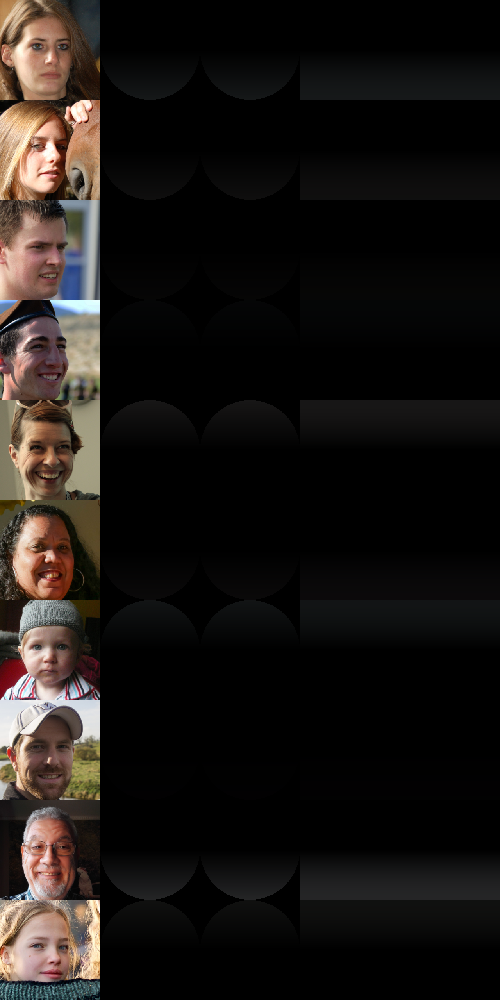

In [4]:
filenames = [
    "01000/01237",
    "00000/00700",
    "00000/00495",
    "01000/01923",
    "01000/01133",
    "00000/00715",
    "00000/00497",
    "00000/00644",
    "00000/00554",
    "01000/01173"
]
generate_face(filenames)

# X - Plus

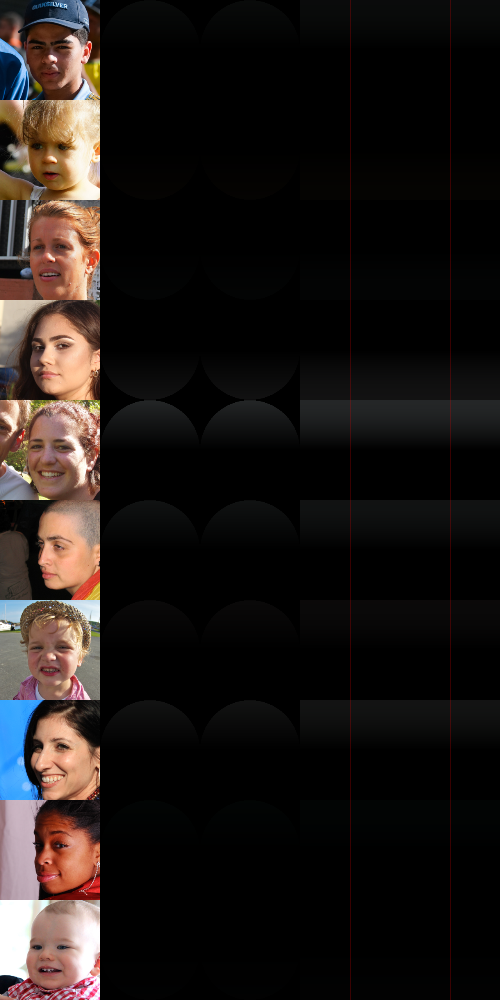

In [5]:
filenames = [
    "01000/01425",
    "00000/00321",
    "01000/01501",
    "01000/01019",
    "00000/00156",
    "00000/00205",
    "01000/01884",
    "01000/01442",
    "01000/01965",
    "00000/00390"
]
generate_face(filenames)

# Y - Minus

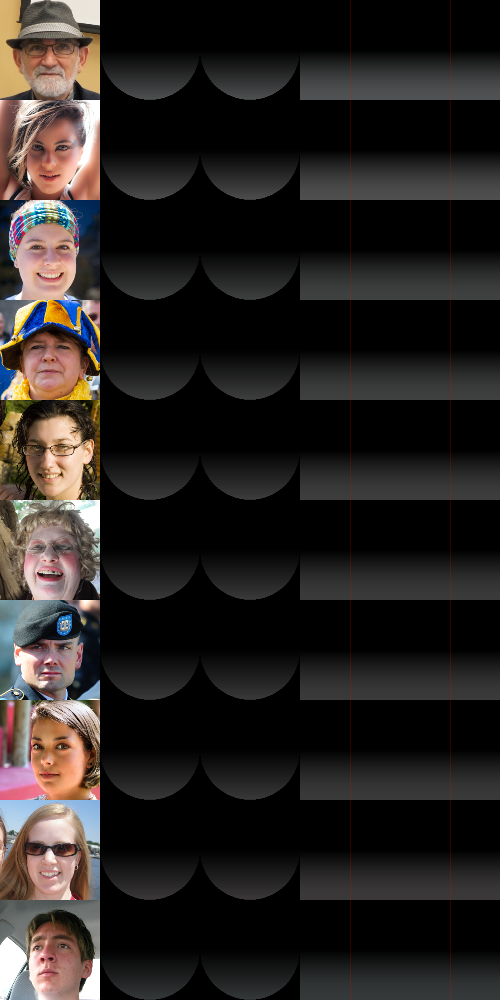

In [6]:
filenames = [
    "00000/00867",
    "00000/00194",
    "01000/01987",
    "00000/00905",
    "00000/00219",
    "00000/00429",
    "01000/01345",
    "00000/00592",
    "01000/01491",
    "01000/01166"

generate_face(filenames)

# Y-Plus

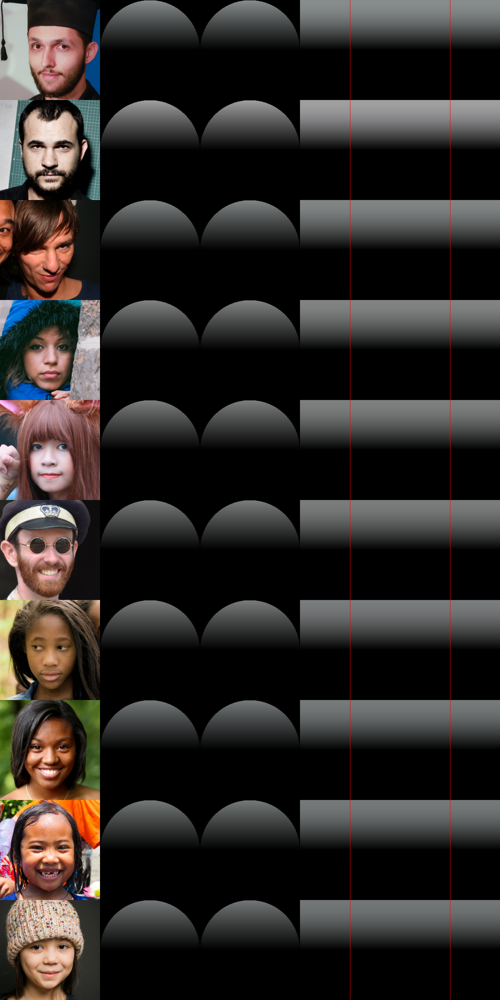

In [7]:
filenames = [
    "01000/01169",
    "01000/01047",
    "00000/00702",
    "01000/01346",
    "01000/01949",
    "01000/01605",
    "01000/01770",
    "01000/01012",
    "00000/00574",
    "01000/01603"
]
generate_face(filenames)

# Z-Minus

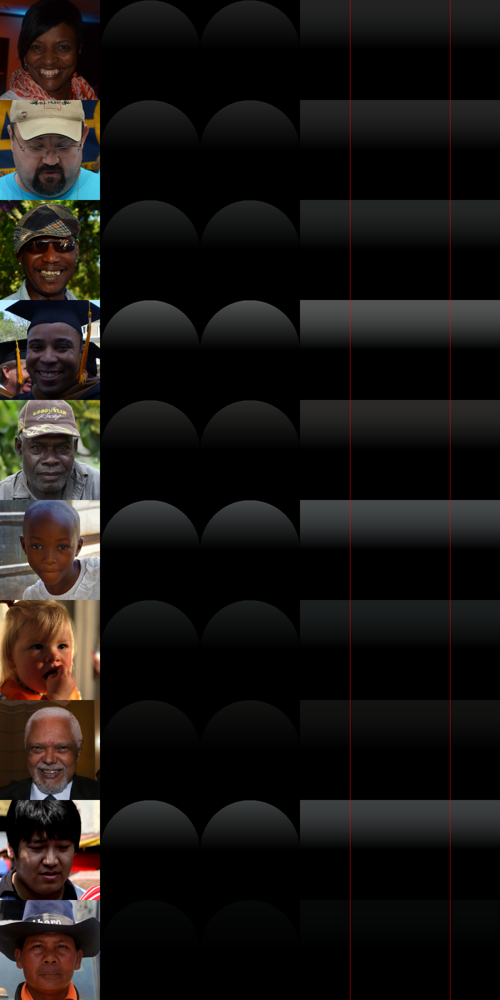

In [8]:
filenames = [
    "01000/01338",
    "00000/00963",
    "01000/01994",
    "00000/00046",
    "00000/00902",
    "00000/00375",
    "01000/01063",
    "00000/00600",
    "00000/00124",
    "01000/01304"
]
generate_face(filenames)

# Z-Plus

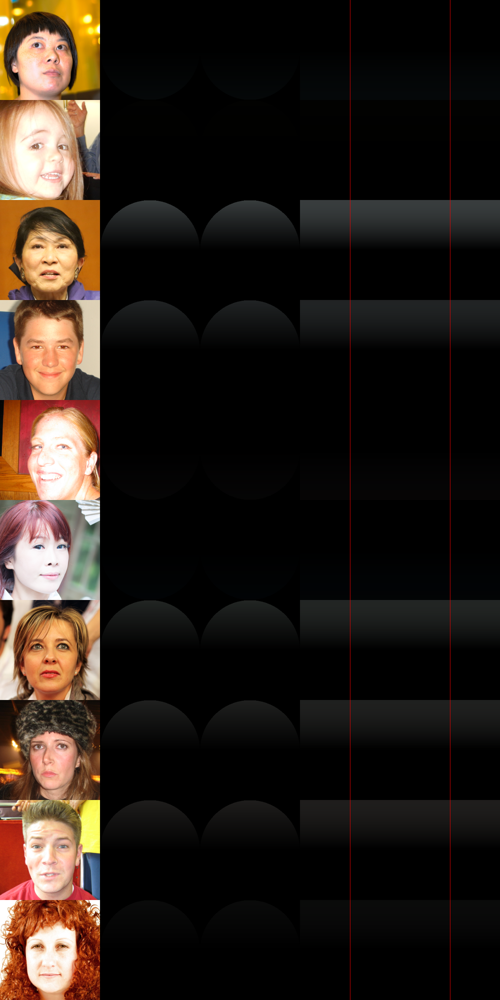

In [9]:
filenames = [
    "01000/01200",
    "00000/00033",
    "00000/00673",
    "01000/01525",
    "00000/00032",
    "01000/01455",
    "01000/01315",
    "01000/01661",
    "00000/00502",
    "01000/01397"
]
generate_face(filenames)